## Analysis of Fast automated drift correction for functional SPM imaging
Code by: Marti Checa

Publication: M. Checa et al "High speed mapping of surface charge dynamics via Spiral Scanning Kelvin Probe Force Microscopy"

## Imports

In [1]:
from __future__ import division, print_function, absolute_import
from scipy.io import loadmat
import glob
import os
import skimage
import time

import pywt # conda install pywavelets
import numpy as np
import matplotlib.pyplot as plt
from celluloid import Camera
import cv2
from scipy.io import savemat
from scipy import interpolate
from skimage.restoration import inpaint
from scipy.optimize import curve_fit

from skimage.color import rgb2gray
from skimage.data import stereo_motorcycle
from skimage.transform import warp
from skimage.registration import phase_cross_correlation
from skimage.registration._phase_cross_correlation import _upsampled_dft
from celluloid import Camera

from PIL import Image
from defisheye import Defisheye

import win32com.client  

print("Cloning package for GP analysis of hyperspectral data...", end=" ")
os.chdir(r'C:\Users\3un\Desktop\Jupyter Notebooks')

import torch
from gprocess import gprutils, skgpr, gpr
torch.set_default_tensor_type(torch.DoubleTensor)

Cloning package for GP analysis of hyperspectral data... 

## Compresed sensing function

In [2]:
def SSTEM(yspar,mask,itern,levels,lambd):  
############################################
#INPUT: 
#yspar: sparse image as an array, to reduce iteration numer, better rescaling the value to [0,1]
#mask: binary array, 1 indicationg sampled pixel locations
#itern: iteration number, usually 20 is enough
#levels: wavelet level, common choice 2,3,4, larger value for larger feature size, if too blur, change to smaller one
#lambd: threshold value, usually 0.8 is fine

#Output: Inpaited image
#############################################   
    fSpars = yspar
    W_thr = [0]*levels;

    ProjC = lambda f, Omega: (1-Omega)*f + Omega*yspar
    
    for i in range(itern):
        fSpars = ProjC(fSpars, mask)
        W_pro = pywt.swt2(fSpars, 'db2',levels)
        for j in range(levels):
            sA = W_pro[j][0]
            sH = W_pro[j][1][0]
            sV = W_pro[j][1][1]
            sD = W_pro[j][1][2]
            W_thr[j] = (pywt.threshold(sA,0,'soft')),(pywt.threshold(sH,lambd,'soft'),
                        pywt.threshold(sV,lambd,'soft'),pywt.threshold(sD,lambd,'soft'))    
        fSpars = pywt.iswt2(W_thr,'db2')
    return fSpars

## Gaussian Process function

In [3]:
def GP_Structured(imgdata,iter__):
  
  R = imgdata
  R[R == R[1, 1]] = np.nan # Take value at [1, 1] as missing data value


  # Construct a grid for the FOV:
  e1, e2 = R.shape
  xx, yy = np.mgrid[:e1:1., :e2:1.]
  X_true = np.array([xx, yy])
  # Get sparse grid corresponding to measurements
  X, R = gprutils.corrupt_data_xy(X_true, R)

  lengthscale = [[1., 1.], [5., 5.]]
  # type of kernel ('RBF' or 'Matern52')
  kernel = 'Matern52'
  
  for ii in range(iter__):
    skreconstructor = skgpr.skreconstructor(X, R, X_true, kernel, 
                                            lengthscale=lengthscale,
                                            input_dim=2, grid_points_ratio=1,  
                                            learning_rate=0.2, iterations=ii, 
                                            calculate_sd=True, num_batches=1,
                                            use_gpu=False, verbose=False)
    (mean, sd), hyperparams = skreconstructor.run()

    gp_data= mean.reshape(128,128)
    gp_data_norm = (gp_data -gp_data.min())/ np.ptp(gp_data)

  return gp_data

## Import Single image file, perform compresed sensing to adjust parameters

Mean = -1.1054581804656745
Std = 1.1677603498222848
Number of pixels scanned --> 4205


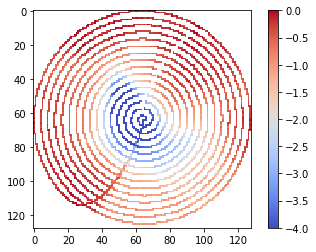

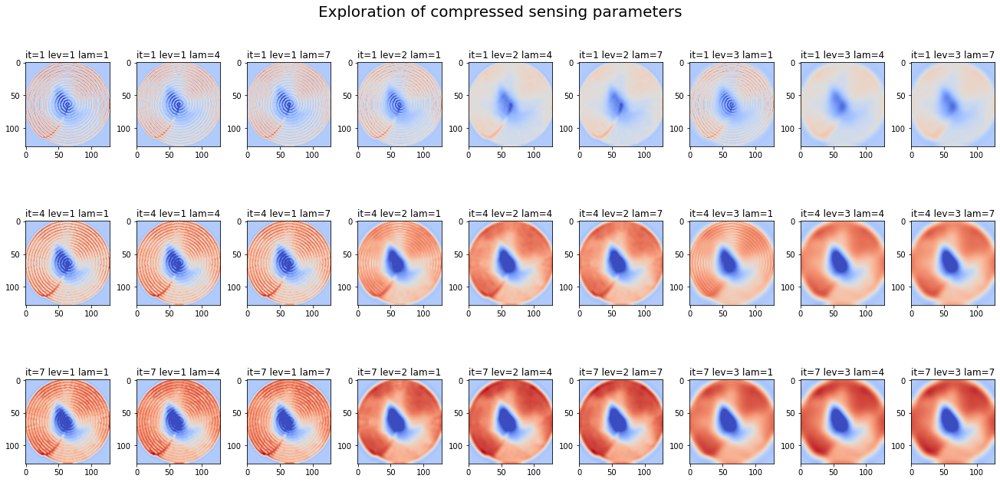

In [4]:
%matplotlib inline
#Set parameters to save data
path_save= r'F:\ORNL\Experimental data\Cypher North\2023\Jan\26th\spiral scann\After-10V_25sec\\'
filename=path_save+'TiO2_diffusion_1_ai1.txt'
imagesize=128
k_rot=0

#arrays of points to delete for the initial of the spiral
array24x=[60,60,54,52,50,49,47,45,44,44,42,42,40,40,37,35,35,33,31,30,28,26,25,24,23,22,21,20,19,16,16,16,15,14,14,14]
array24y=[63,64,65,66,67,67,68,69,69,70,70,71,71,72,73,74,75,76,77,77,79,81,81,83,83,85,85,87,87,91,92,93,94,94,97,98]

array12x=[57,56,50,57,55,51,51,50,47,44,44,42,42,47,46,45,41,40,40,39,39,36,35,35,32,32,31,30,30,27,26,86,26,25,25,23,22,22,21,19,19,18,18,17,17,15,15,14,14,14,13,13,13,13,13,13]
array12y=[63,64,65,64,64,65,66,66,67,68,69,69,70,68,68,68,70,70,71,71,72,73,73,74,75,76,76,76,77,79,79,80,80,80,81,83,83,84,84,86,87,87,88,88,89,91,92,92,93,94,97,98,99,100,101,102]

array10x=[34,34,46,62,61,60,59,60,12,12,12,12,15,20,20,19,18,16,16,21,24,23,29,28,31,36,37,38,43,48,49,48,53,52,54,53,56,57,56,50,57,55,50,47,44,44,42,42,47,46,41,40,40,36,35,35,32,32,31,30,30,27,26,86,26,25,25,22,22,21,19,19,18,17,15,15,14,14,14,13,13,13,13,13,13]
array10y=[73,74,67,62,62,62,63,63,97,98,99,100,90,84,85,85,86,89,90,83,81,81,77,77,75,72,72,72,69,67,66,66,65,65,64,64,63,63,64,65,64,64,66,67,68,69,69,70,68,68,70,70,71,73,73,74,75,76,76,76,77,79,79,80,80,80,81,83,84,84,86,87,87,89,91,92,92,93,94,97,98,99,100,101,102]

array6x=[47,48,59,60,61,55,56,57,58,59,54,55,50,51,52,50,49,48,47,45,46,43,44,45,41,41,40,39,39,38,37,73,36,36,35,34,34,33,37,31,31,30,29,29,28,28,27,26,26,25,25,24,21,21,20,20,19,19,18,18,17,16,17,16,16,13,13,13,12,12,12,12,11,11,11,11,11,11]
array6y=[66,66,61,61,61,62,62,62,62,62,63,63,64,64,64,65,65,65,65,66,66,67,67,67,68,69,69,69,70,70,70,71,71,72,72,72,73,73,71,74,75,75,75,76,76,77,77,77,78,78,79,80,81,82,82,83,83,84,84,85,85,86,86,87,88,90,91,92,92,93,94,95,95,96,97,98,99,100]

#plot the data
VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
# plt.imshow(VCPD, vmin=0.3,vmax=1.1,cmap='bwr_r')
# plt.colorbar()
# plt.show()

cont=0
#we find the mask
mask=np.zeros((imagesize,imagesize))
for ii in range(VCPD.shape[0]):
    for jj in range(VCPD.shape[1]):
        if VCPD[ii,jj] != VCPD[0,0]:
            mask[ii,jj] = 1
            cont=cont+1
            
values=np.zeros((cont))
cont2=0
for ii in range(VCPD.shape[0]):
    for jj in range(VCPD.shape[1]):
        if VCPD[ii,jj] != VCPD[0,0]:
            values[cont2]=VCPD[ii,jj]
            cont2=cont2+1

print('Mean = ' + str(np.mean(values)))
print('Std = ' + str(np.std(values)))
            
#plot the data
# plt.imshow(mask)
# plt.colorbar()
# plt.show()

print('Number of pixels scanned --> ' +str(np.count_nonzero(mask == 1)))


VCPD_plot=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
VCPD_plot[mask==0]=np.nan
#we eliminate the first part of the spiral
for i in range(len(array10x)):
    VCPD_plot[array10x[i],array10y[i]]=np.nan
    
plt.figure()        
plt.imshow(VCPD_plot, vmin=-4,vmax=0, cmap='coolwarm',interpolation='none')
plt.colorbar()
plt.show()   
            
#find the correct CSensing parameters
n_steps=3
ite_ini=1
lev_ini=1
lam_ini=1
ite_step=3
lev_step=1
lam_step=3

fig, axs = plt.subplots(n_steps, (n_steps)**2,figsize=(n_steps*6,n_steps*3),constrained_layout=True)

for i in range(n_steps):
    itern= ite_ini+i*ite_step
    for j in range(n_steps):
        levels= lev_ini+j*lev_step
        for k in range(n_steps):
            lambd= lam_ini+k*lam_step
            
            vcpd_recon = SSTEM(VCPD,mask,itern,levels,lambd)
            param_print ='it=' + str(itern) +' lev='+ str(levels) + ' lam='+ str(lambd)
            axs[i,k+(j*n_steps)].imshow(vcpd_recon,vmin=-4,vmax=0, cmap='coolwarm')
            axs[i,k+(j*n_steps)].set_title(param_print)
            
plt.suptitle('Exploration of compressed sensing parameters',fontsize=20)
plt.show()

In [5]:
#Select the prefered CS parameters
itern=4
levels=2
lambd=4

## Compare compresed sensing with GP reconstruction

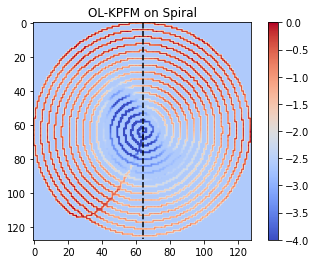

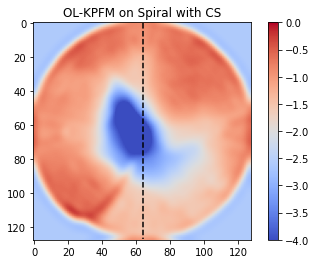

Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


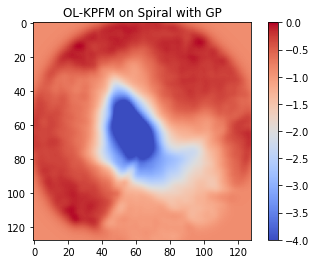

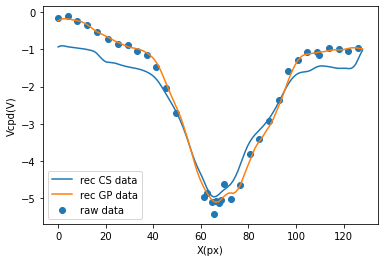

In [6]:
%matplotlib inline

#choose color limits
cscale_max=0
cscale_min=-4

#choose line to plt profile
line=64

#read data and plot
VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
plt.imshow(VCPD,vmin=cscale_min,vmax=cscale_max, cmap='coolwarm')
plt.plot(np.full((128,),line),np.linspace(0,imagesize-1,num=128),'--k')
plt.colorbar()
plt.title('OL-KPFM on Spiral')
plt.show()

#Perform CS
VCPD_rec = SSTEM(VCPD,mask,itern,levels,lambd)

plt.imshow(VCPD_rec,vmin=cscale_min,vmax=cscale_max, cmap='coolwarm')
plt.plot(np.full((128,),line),np.linspace(0,imagesize-1,num=128),'--k')
plt.colorbar()
plt.title('OL-KPFM on Spiral with CS')
plt.show()

VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
VCPD[mask==0]=np.nan
for i in range(len(array10x)):
    VCPD[array10x[i],array10y[i]]=np.nan

#Perform GP
VCPD_recGP = GP_Structured(VCPD,6);

#Plot results
plt.imshow(VCPD_recGP,vmin=cscale_min,vmax=cscale_max, cmap='coolwarm')
#plt.plot(np.full(line,(128,)),np.linspace(0,imagesize-1,num=128),'--k')
plt.colorbar()
plt.title('OL-KPFM on Spiral with GP')
plt.show()

plt.scatter(np.linspace(0,128,128),VCPD[:,line],label='raw data')
plt.plot(np.linspace(0,128,128),VCPD_rec[:,line],label='rec CS data')
plt.plot(np.linspace(0,128,128),VCPD_recGP[:,line],label='rec GP data')
plt.legend()
plt.xlabel('X(px)')
plt.ylabel('Vcpd(V)')
plt.show()


In [7]:
#Save the profile data
path_save= r'F:\ORNL\Experimental data\Cypher North\2022\Dec 2022\8th\\'
np.savetxt(path_save  +'_profilesKPFM_FigureS1_L=7.txt', VCPD_recGP[:,line], delimiter=',') 
np.savetxt(path_save  +'_profilesX.txt',  np.linspace(0,128,128), delimiter=',') 

## Calculate CS for all frames in a temporal series data

Iteration=0


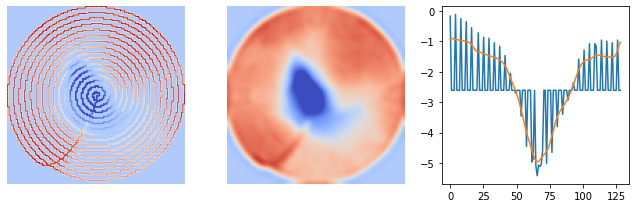

Iteration=1


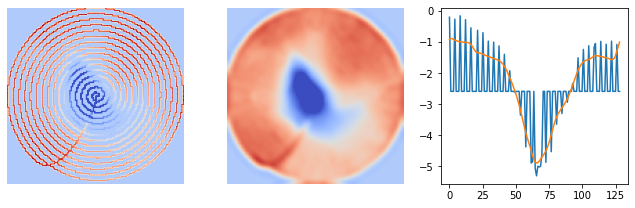

Iteration=2


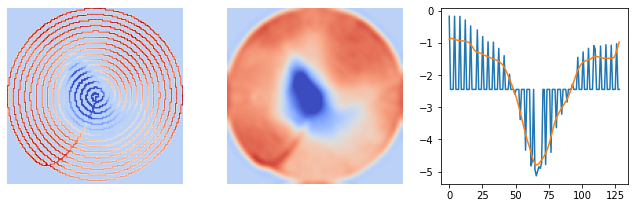

Iteration=3


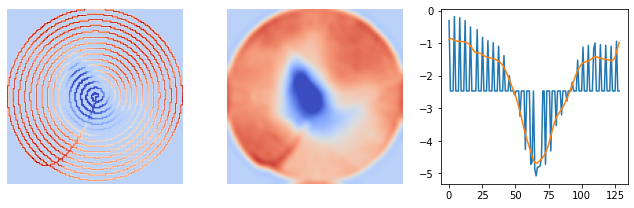

Iteration=4


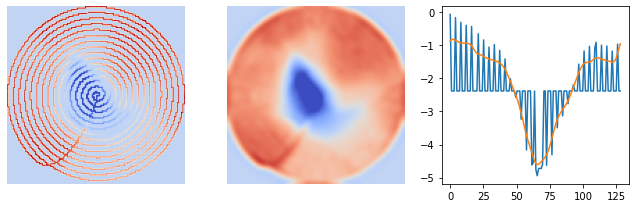

Iteration=5


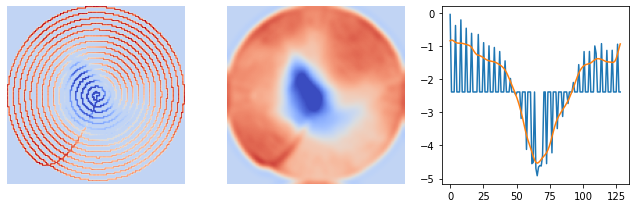

Iteration=6


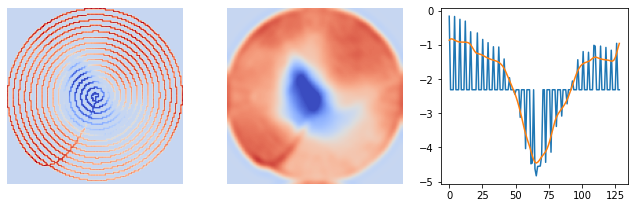

Iteration=7


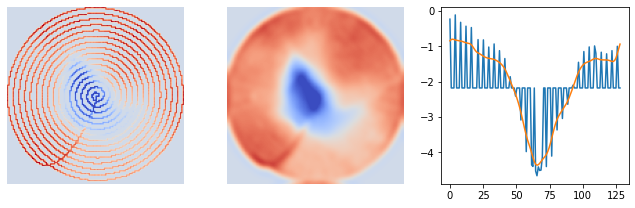

Iteration=8


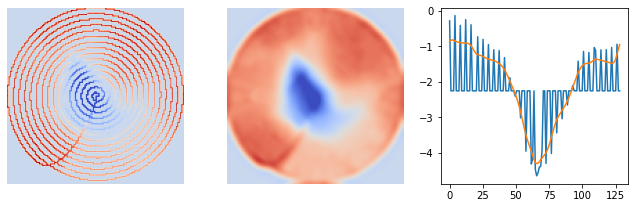

Iteration=9


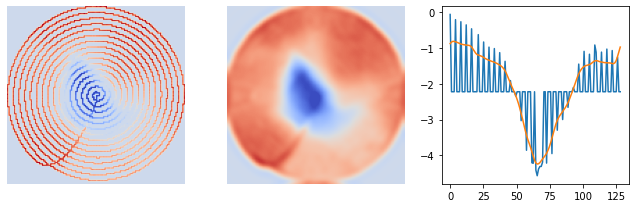

Iteration=10


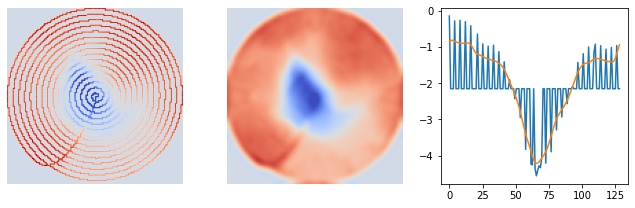

Iteration=11


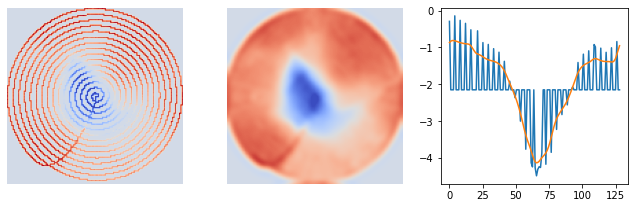

Iteration=12


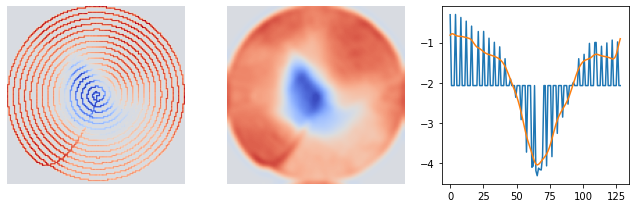

Iteration=13


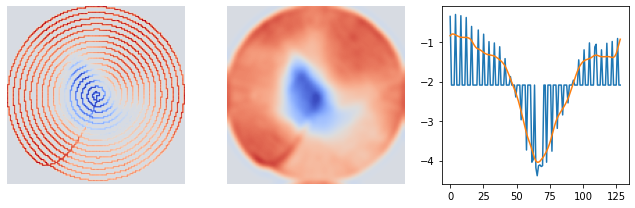

Iteration=14


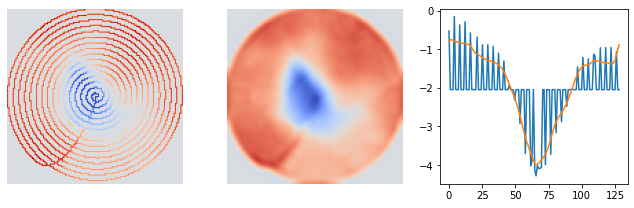

Iteration=15


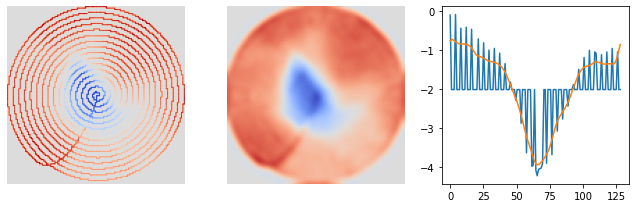

Iteration=16


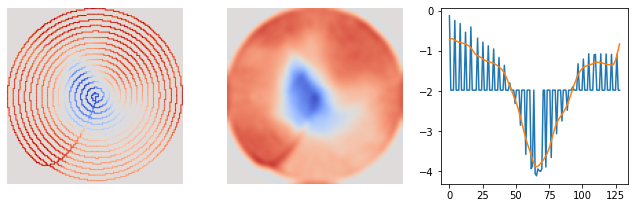

Iteration=17


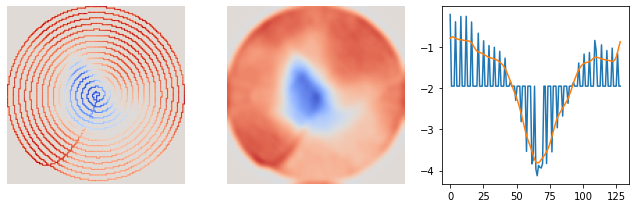

Iteration=18


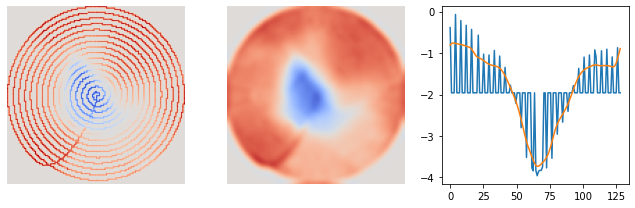

Iteration=19


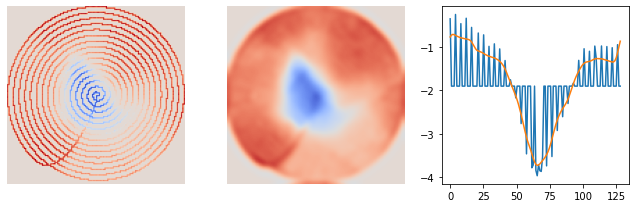

Iteration=20


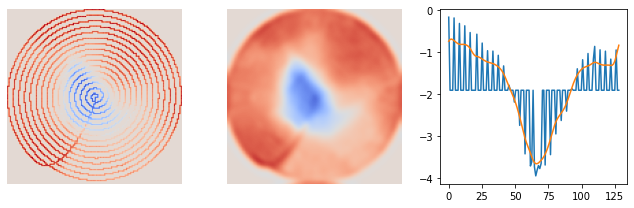

Iteration=21


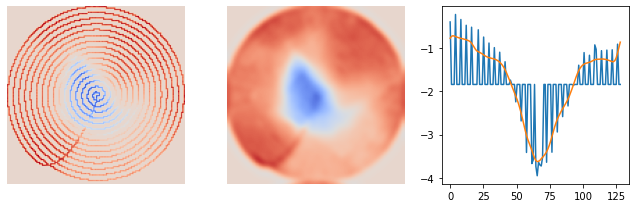

Iteration=22


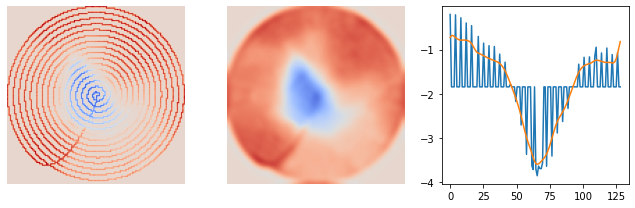

Iteration=23


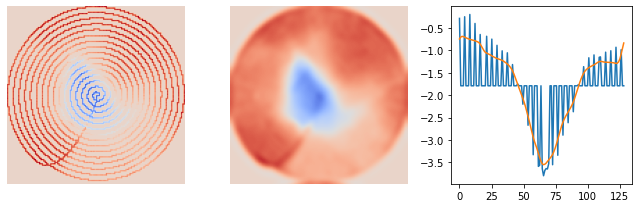

Iteration=24


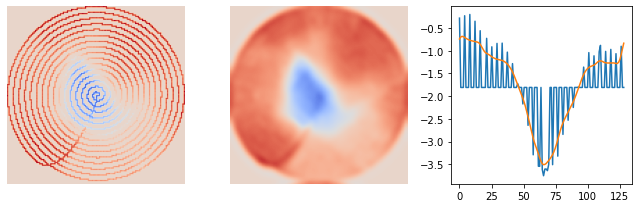

Iteration=25


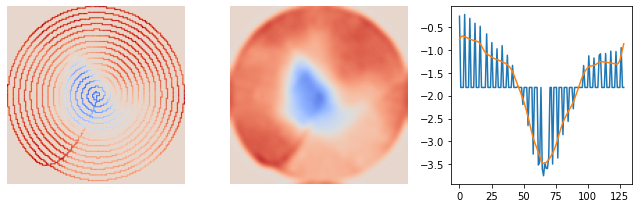

Iteration=26


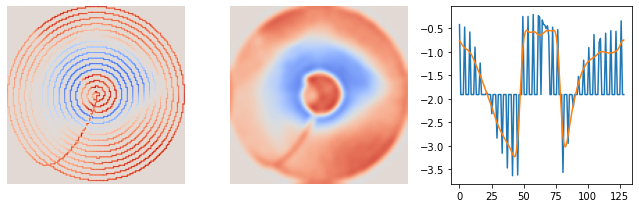

Iteration=27


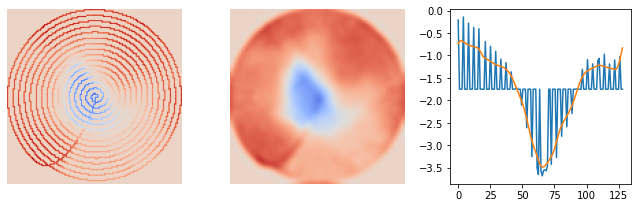

Iteration=28


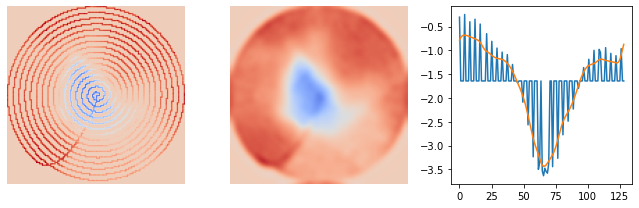

Iteration=29


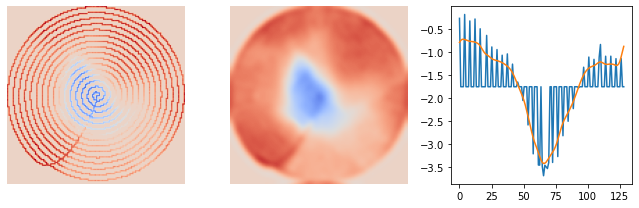

Iteration=30


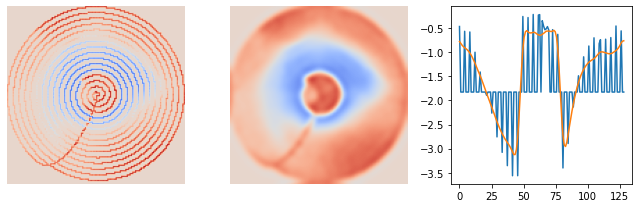

Iteration=31


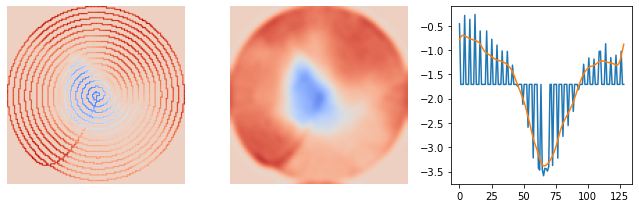

Iteration=32


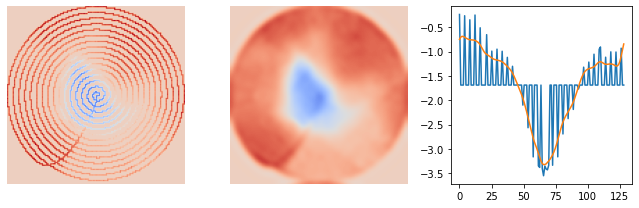

Iteration=33


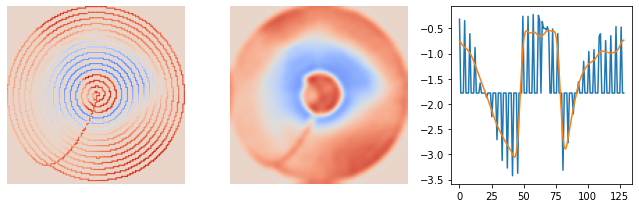

Iteration=34


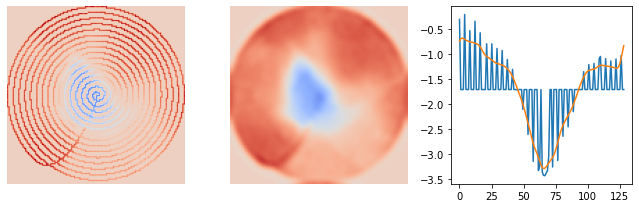

Iteration=35


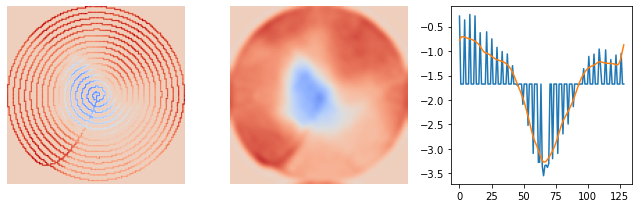

Iteration=36


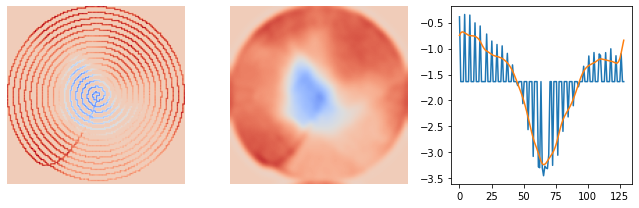

Iteration=37


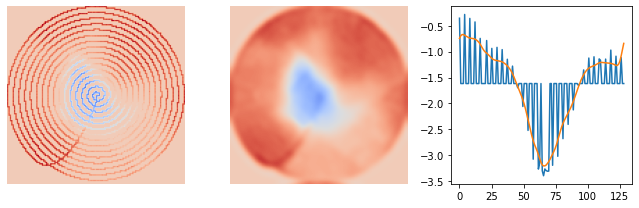

Iteration=38


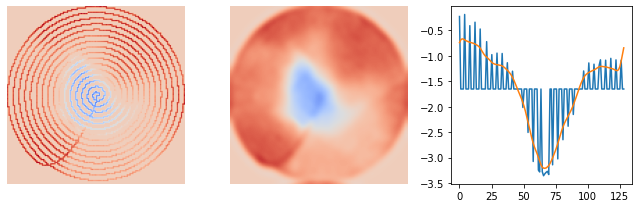

Iteration=39


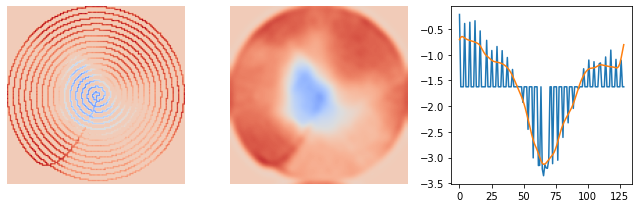

Iteration=40


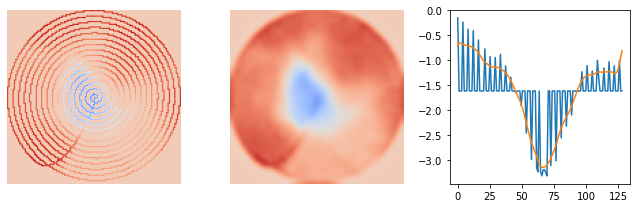

Iteration=41


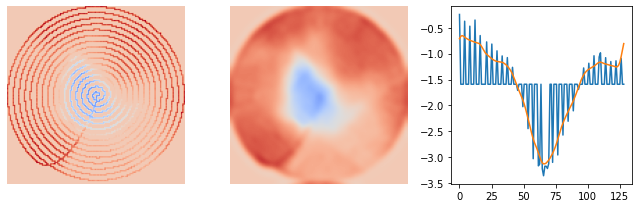

Iteration=42


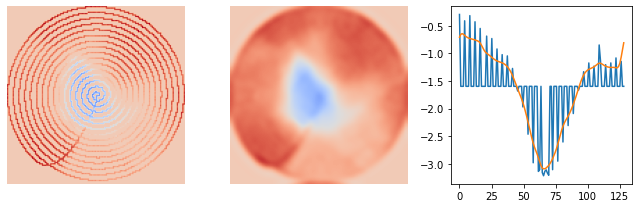

Iteration=43


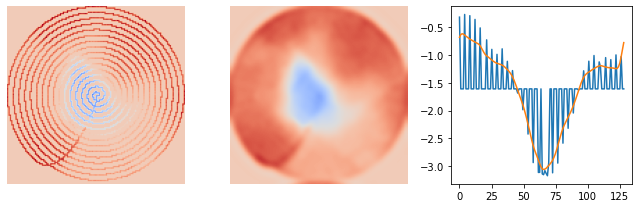

Iteration=44


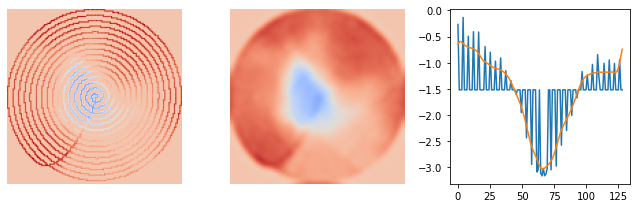

Iteration=45


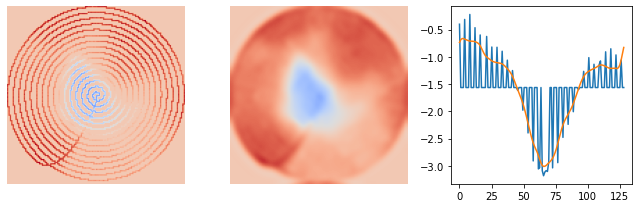

Iteration=46


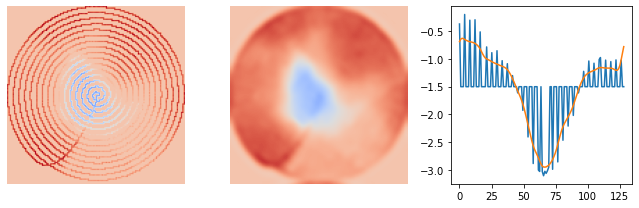

Iteration=47


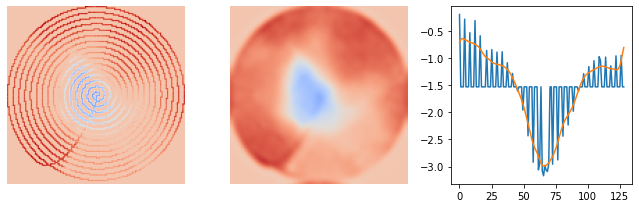

Iteration=48


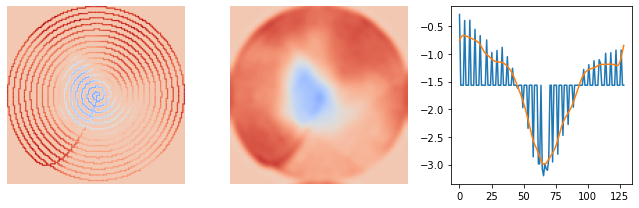

Iteration=49


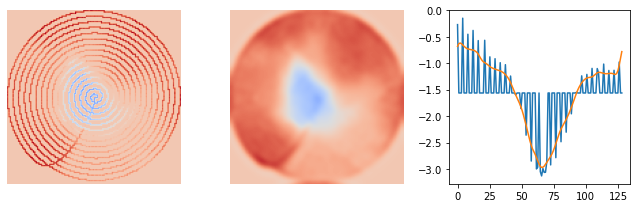

Iteration=50


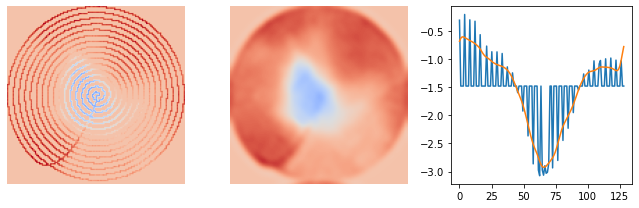

Iteration=51


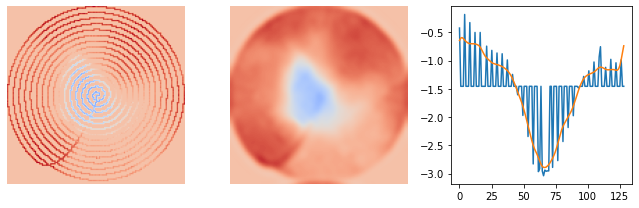

Iteration=52


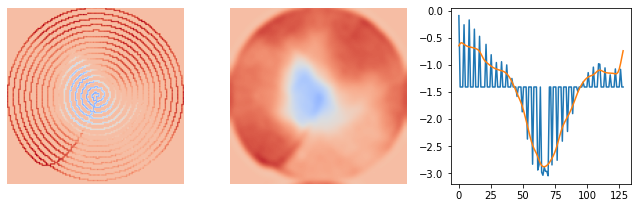

Iteration=53


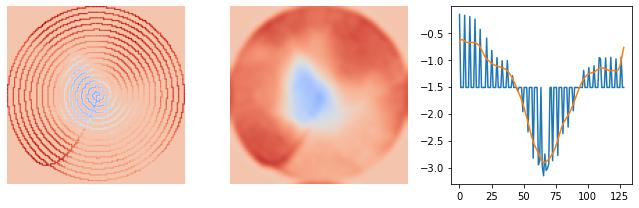

Iteration=54


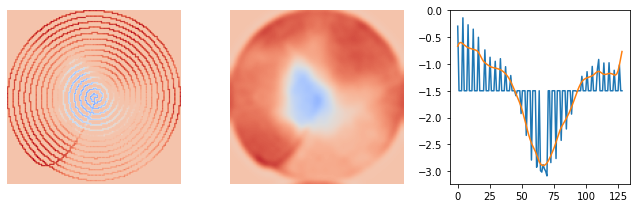

Iteration=55


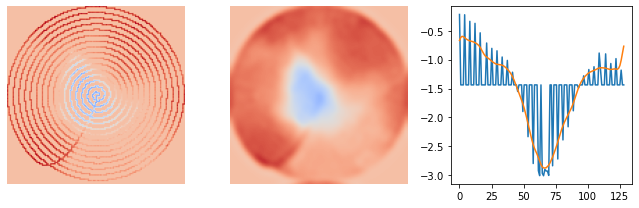

Iteration=56


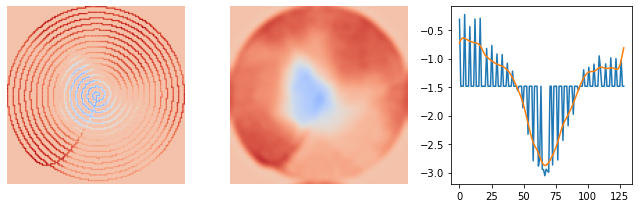

Iteration=57


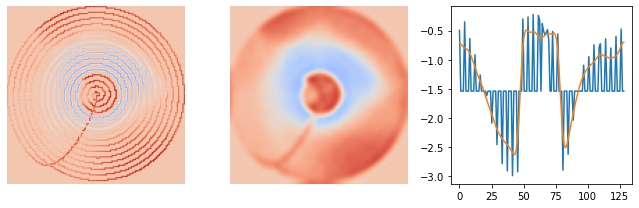

Iteration=58


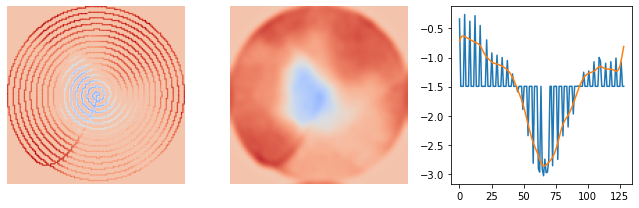

Iteration=59


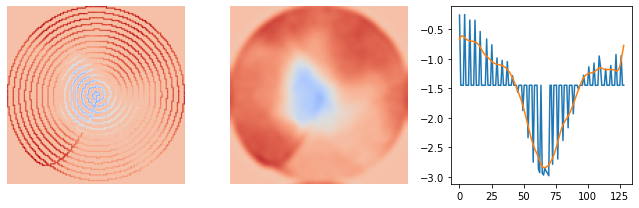

Iteration=60


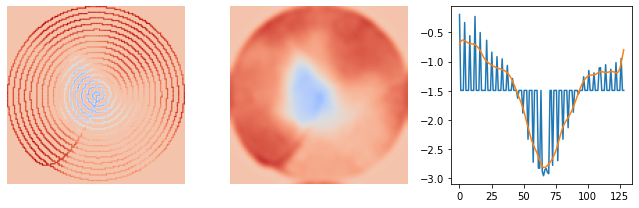

Iteration=61


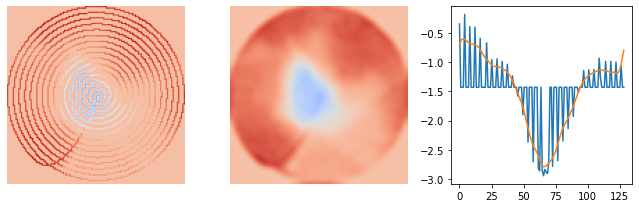

Iteration=62


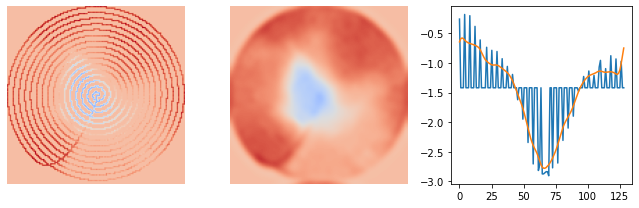

Iteration=63


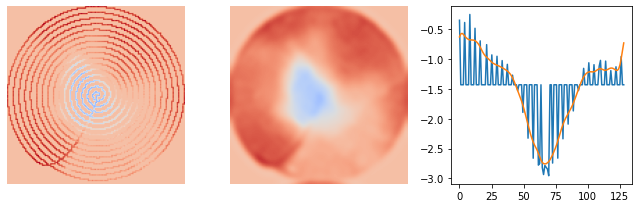

Iteration=64


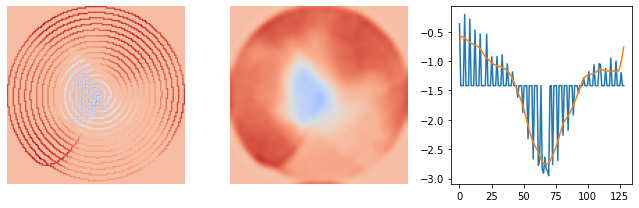

Iteration=65


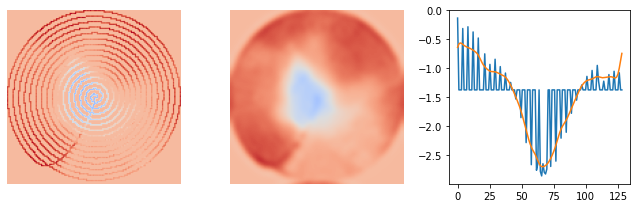

Iteration=66


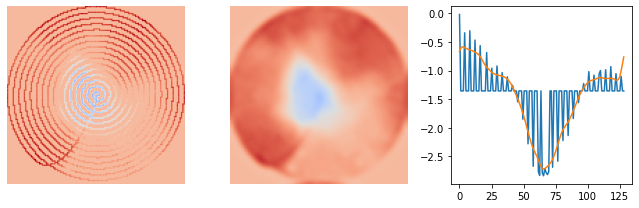

Iteration=67


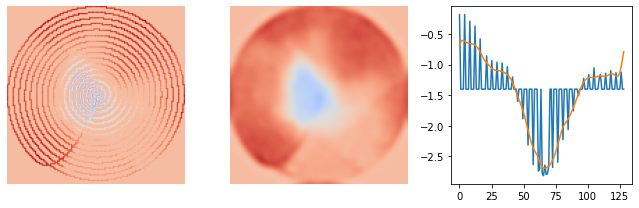

Iteration=68


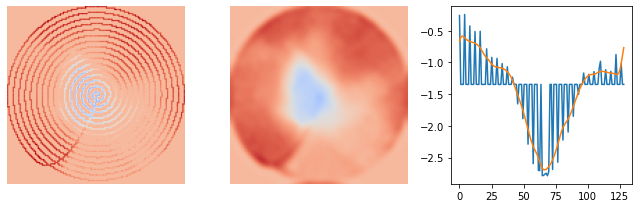

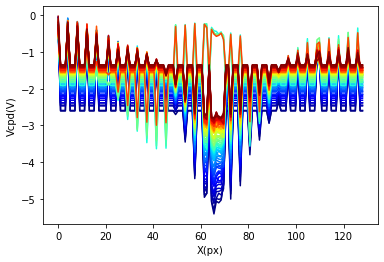

<function matplotlib.pyplot.show(close=None, block=None)>

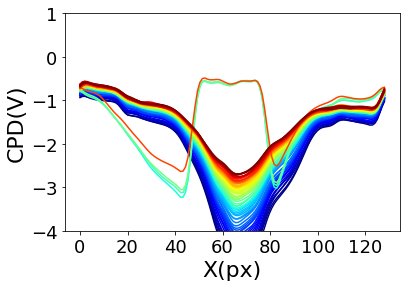

In [8]:
n_frames=69
line=64
profiles=np.zeros((n_frames,imagesize))
profiles_rec=np.zeros((n_frames,imagesize))
VDC_fullmatPos=np.zeros((n_frames,imagesize,imagesize))
bad_frames=[]

path_save= r'F:\ORNL\Experimental data\Cypher North\2023\Jan\26th\spiral scann\After-10V_25sec\\'

mask_new=np.rot90(mask,k=0)

for i in range(n_frames):
    filename=path_save+'TiO2_diffusion_'+str(i+1)+'_ai1.txt'
    print('Iteration='+str(i))
    
    VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=0)
    VCPD_rec = SSTEM(VCPD,mask_new,itern,levels,lambd)
    profiles[i,:]=VCPD[:,line]
    profiles_rec[i,:]=VCPD_rec[:,line]
    VDC_fullmatPos[i,:,:]=VCPD_rec
    
    fig, ax = plt.subplots(1, 3, figsize=(9, 3))
    
    im1=ax[0].imshow(VCPD,vmin=-4,vmax=0,cmap='coolwarm')
    ax[0].axis('off')
    ax[1].imshow(VCPD_rec,vmin=-4,vmax=0,cmap='coolwarm')
    ax[1].axis('off')
    ax[2].plot(np.linspace(0,128,128),profiles[i,:])
    ax[2].plot(np.linspace(0,128,128),profiles_rec[i,:])
    plt.tight_layout()
    
    plt.show()

colors = plt.cm.jet(np.linspace(0,1,n_frames))
for i in range(n_frames):
    plt.plot(np.linspace(0,128,128),profiles[i,:],color=colors[i])

plt.xlabel('X(px)')
plt.ylabel('Vcpd(V)')
plt.show()

for i in range(n_frames):
    if i+1 not in bad_frames: 
        plt.plot(np.linspace(0,128,128),profiles_rec[i,:],color=colors[i])
    else:
        print(i)
    
plt.xlabel('X(px)',fontsize='22')
plt.ylabel('CPD(V)',fontsize='22')
plt.ylim([-4,1])
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show

#-10VBadframes [27,31,34,58,60]
#-8VBadframes [20,60,65,66]
#-5VBadframes [20,33,39,54,65]
#5VBadframes [18,55,64]
#8VBadframes [58,63,65,66,67,68]
#10VBadframes [47,48,51,56,57]

## Save the animation of the CS reconstruction 

MovieWriter PillowWriter unavailable; using Pillow instead.


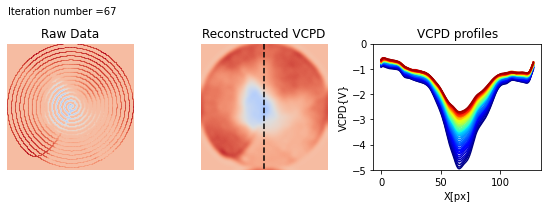

In [9]:
##Animation 
path_save= r'F:\ORNL\Experimental data\Cypher North\2023\Jan\26th\spiral scann\After-10V_25sec\\'
# We do the animation of the shift correction
os.chdir(path_save)
bad_frames=[27,31,34,58,60]

fig, ax = plt.subplots(1, 3, figsize=(8, 3))
ax[0].set_title('Raw Data' )
ax[1].set_title('Reconstructed VCPD')
ax[2].set_title('VCPD profiles' )
ax[2].set_xlabel('X[px]')
ax[2].set_ylabel('VCPD{V}')
ax[0].axis('off')
ax[1].axis('off')
ax[2].set_ylim([-5,0])
colors = plt.cm.jet(np.linspace(0,1,n_frames))

camera = Camera(fig)

for i in range(n_frames-1):
    
    if i+1 not in bad_frames: 
        filename=path_save+'TiO2_diffusion_'+str(i+1)+'_ai1.txt'
    
        VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=0)
        VCPD_rec = SSTEM(VCPD,mask_new,itern,levels,lambd)
        profiles_rec[i,:]=VCPD_rec[:,line]
    
        im1=ax[0].imshow(VCPD,vmin=-4,vmax=0,cmap='coolwarm')
        im2=ax[1].imshow(VCPD_rec,vmin=-4,vmax=0,cmap='coolwarm')
        ax[1].plot(np.full((128,),line),np.linspace(0,imagesize-1,num=128),'--k')
        for k in range(0,i):
            if k+1 not in bad_frames: 
                ax[2].plot(np.linspace(0,128,128),profiles_rec[k,:],color=colors[k])
    
        plt.tight_layout()

        ax[0].text(0,-30,'Iteration number =' + str(i), fontsize=10)
    
        #if i<6:
            #state='off'
        #else:
            #state='on'
        
        #ax[1].text(0,-30,'V S-D =' + state, fontsize=10)
        camera.snap()
    
animation = camera.animate()
animation.save('Animation-10V_test.gif', writer='PillowWriter', fps=4)

## Calculate GP for all frames in a temporal series data

Iteration=0
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


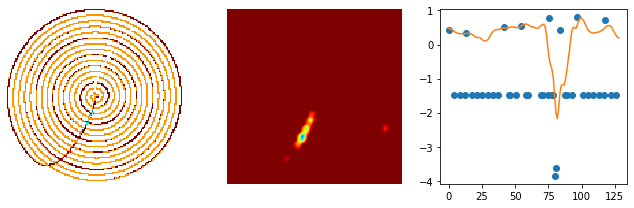

Iteration=1
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


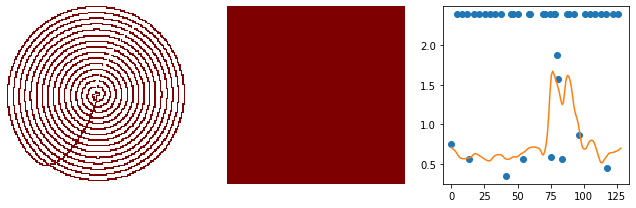

Iteration=2
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


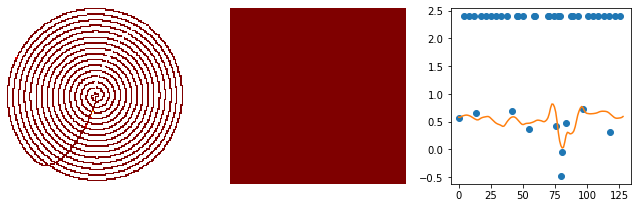

Iteration=3
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


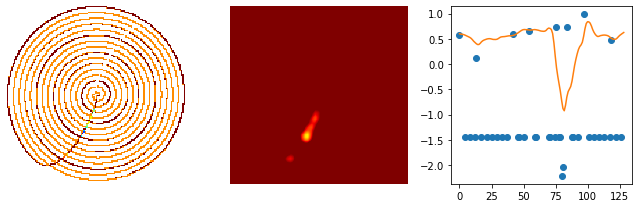

Iteration=4
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


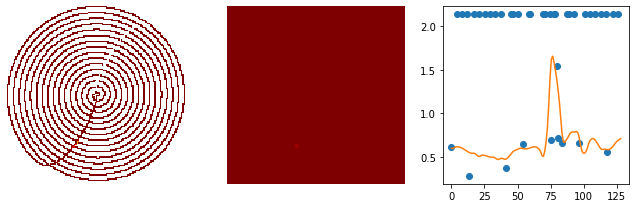

Iteration=5
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


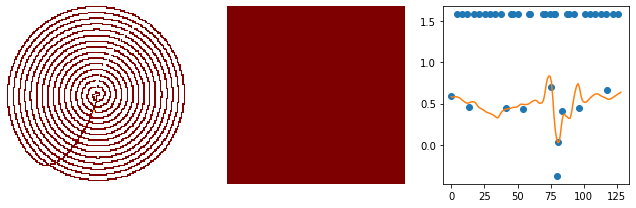

Iteration=6
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


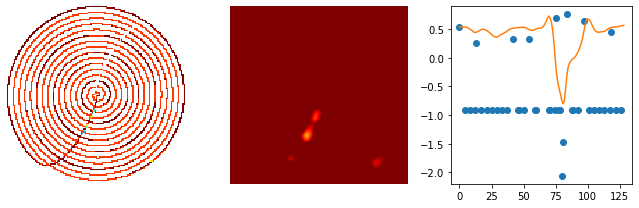

Iteration=7
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


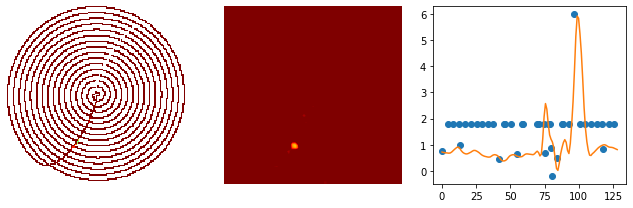

Iteration=8
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


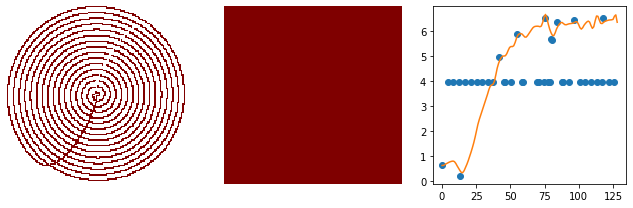

Iteration=9
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


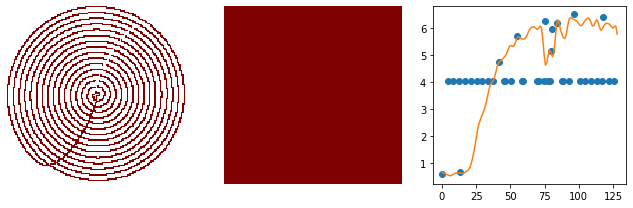

Iteration=10
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


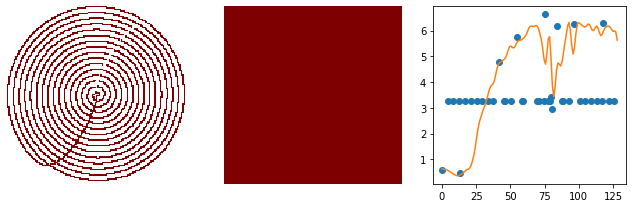

Iteration=11
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


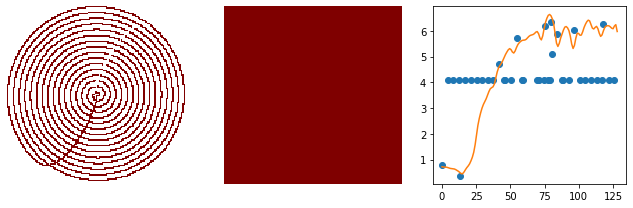

Iteration=12
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


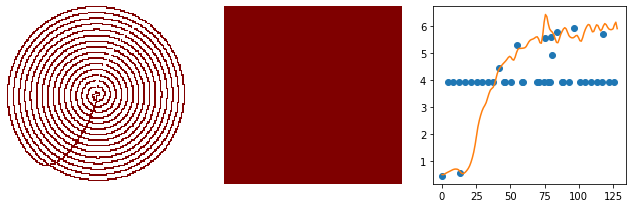

Iteration=13
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


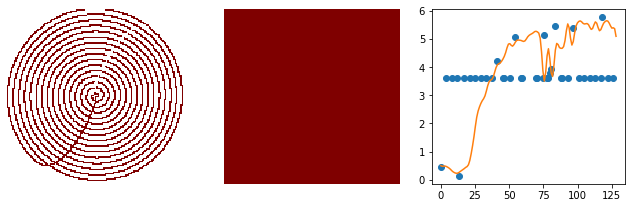

Iteration=14
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


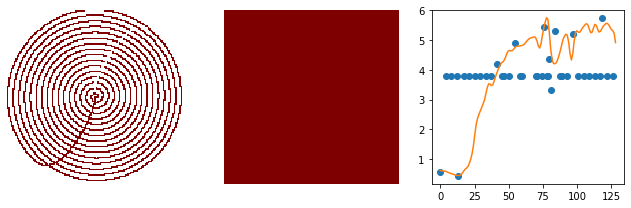

Iteration=15
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


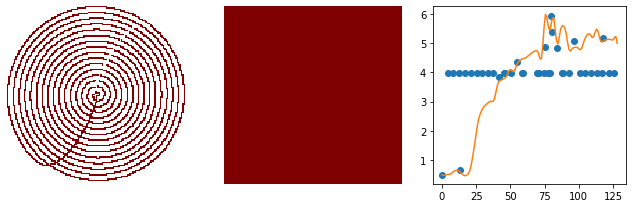

Iteration=16
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


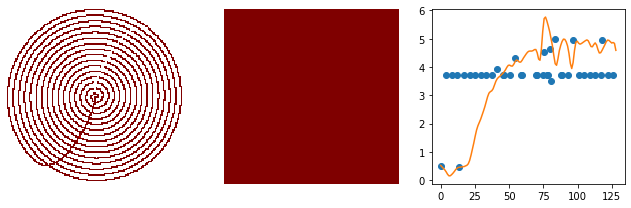

Iteration=17
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


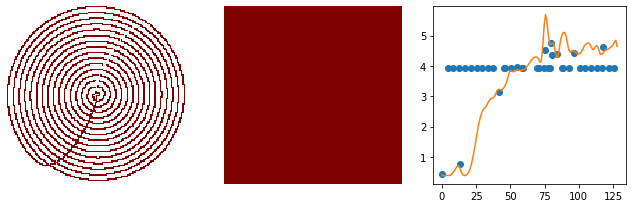

Iteration=18
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


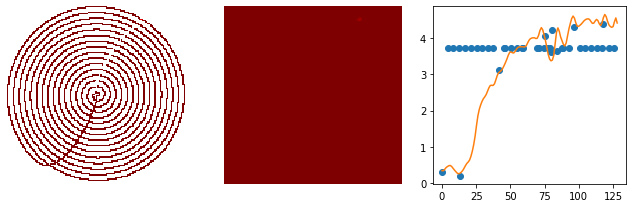

Iteration=19
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


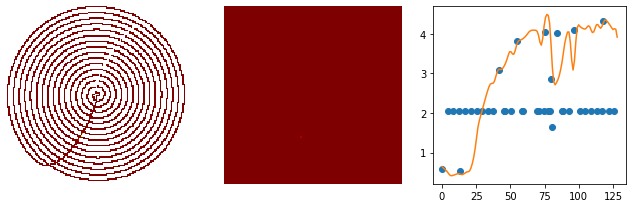

Iteration=20
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


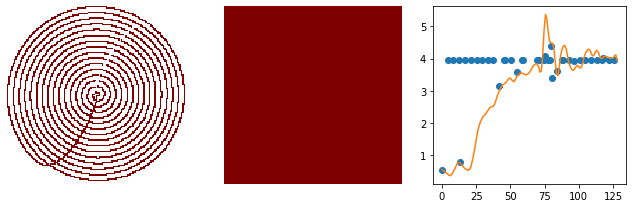

Iteration=21
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


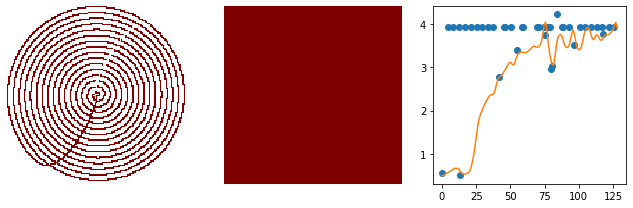

Iteration=22
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


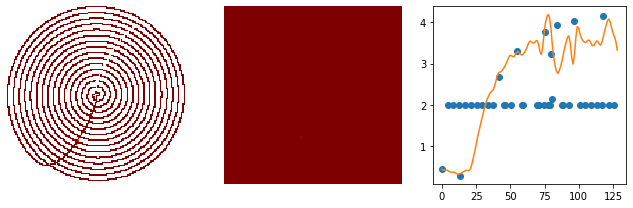

Iteration=23
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


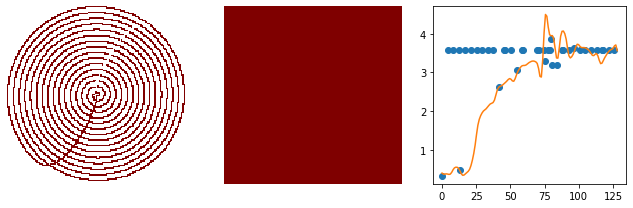

Iteration=24
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


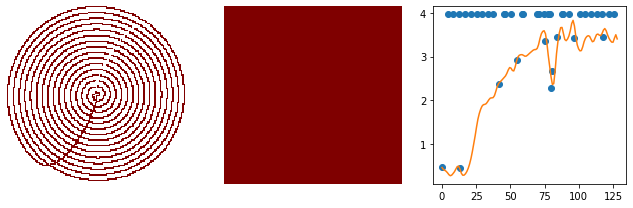

Iteration=25
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


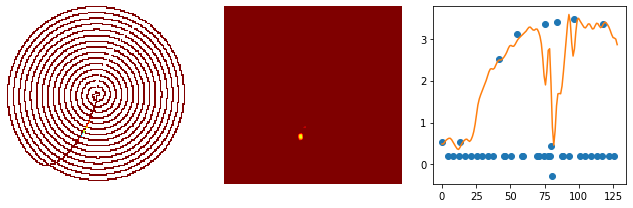

Iteration=26
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


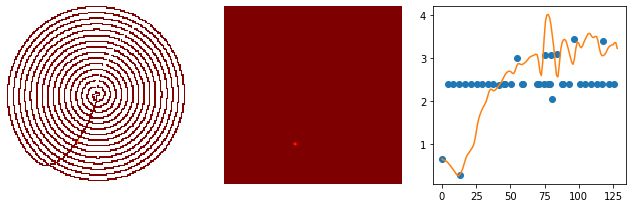

Iteration=27
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


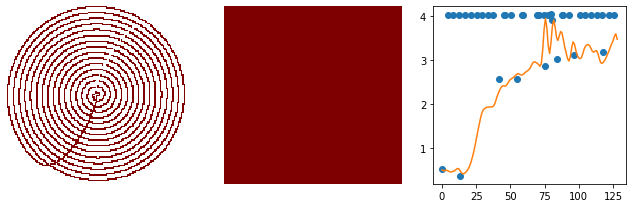

Iteration=28
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


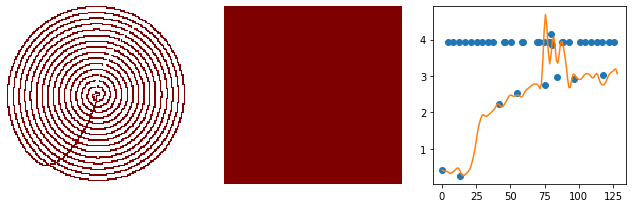

Iteration=29
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


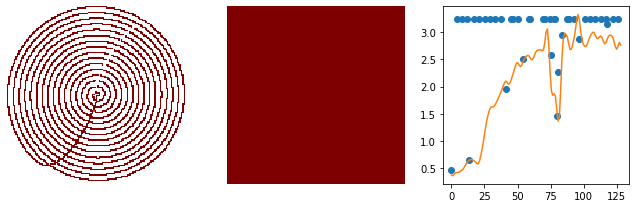

Iteration=30
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


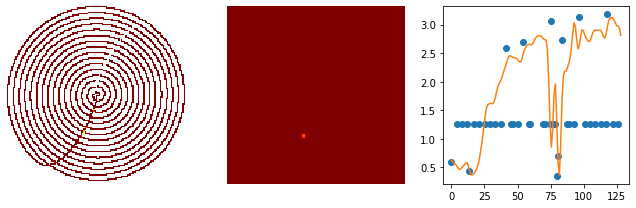

Iteration=31
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


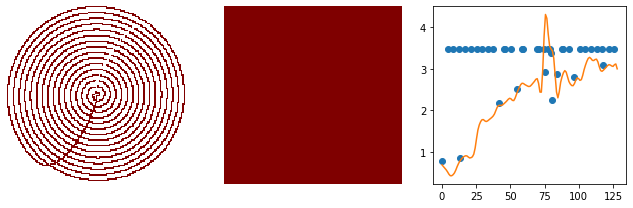

Iteration=32
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


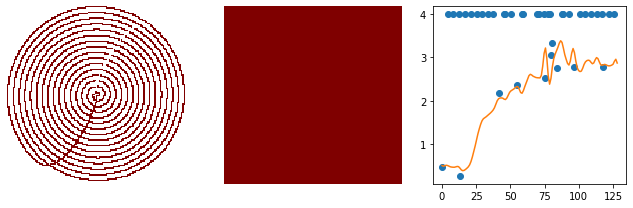

Iteration=33
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


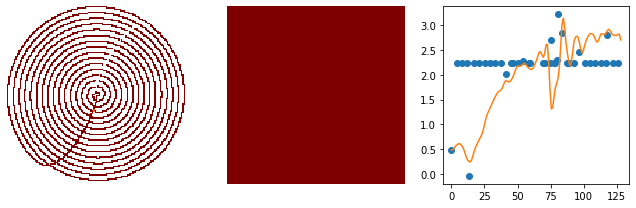

Iteration=34
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


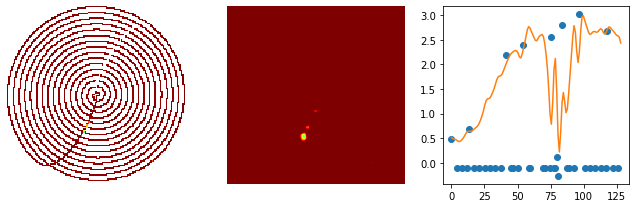

Iteration=35
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


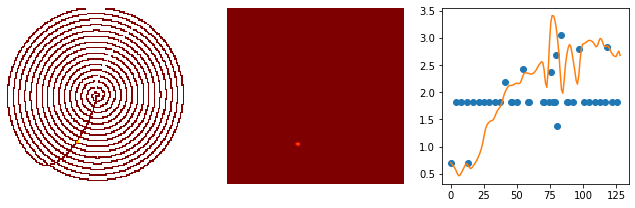

Iteration=36
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


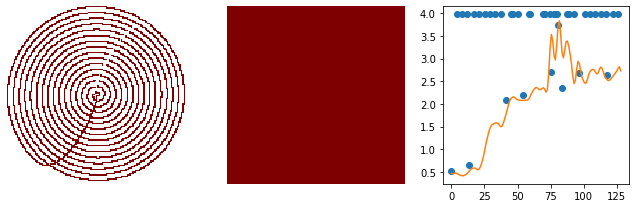

Iteration=37
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


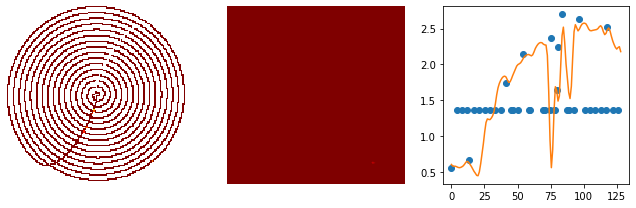

Iteration=38
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


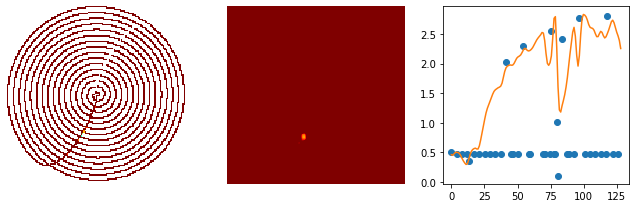

Iteration=39
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


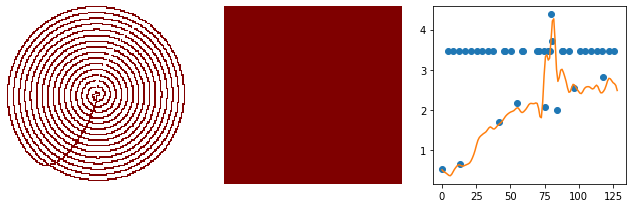

Iteration=40
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


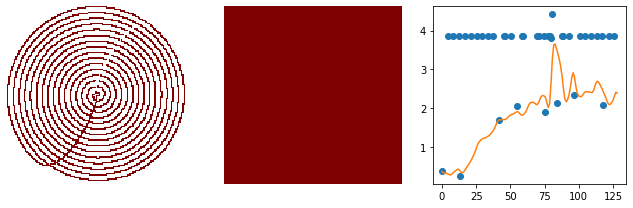

Iteration=41
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


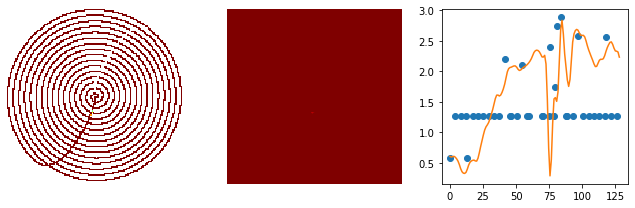

Iteration=42
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


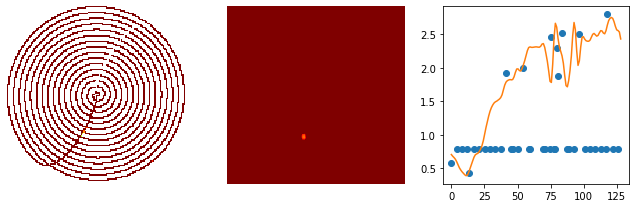

Iteration=43
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


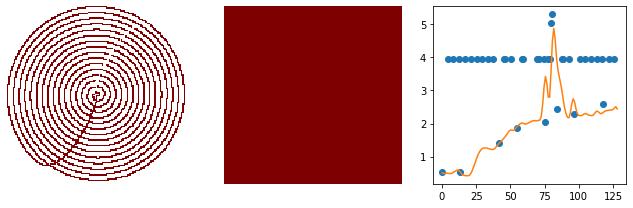

Iteration=44
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


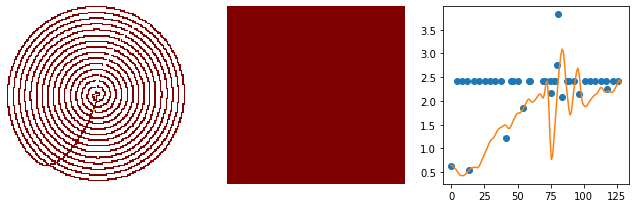

Iteration=45
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


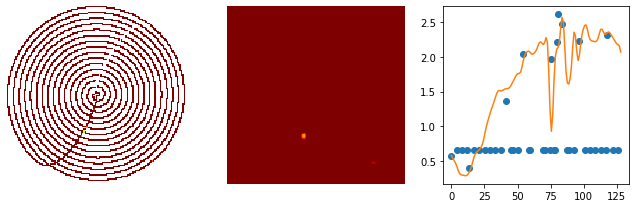

Iteration=46
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


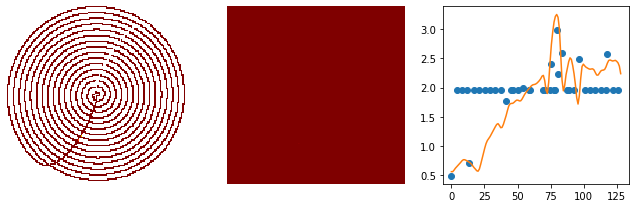

Iteration=47
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


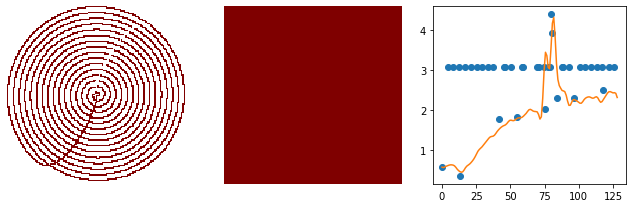

Iteration=48
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


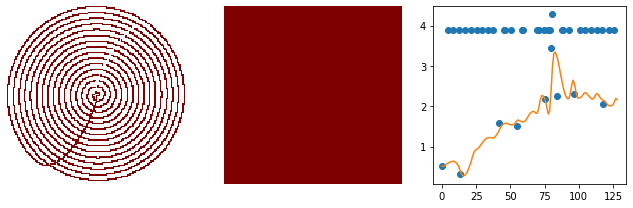

Iteration=49
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


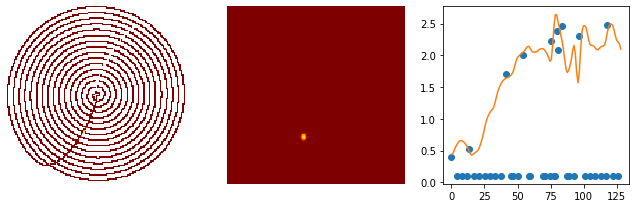

Iteration=50
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


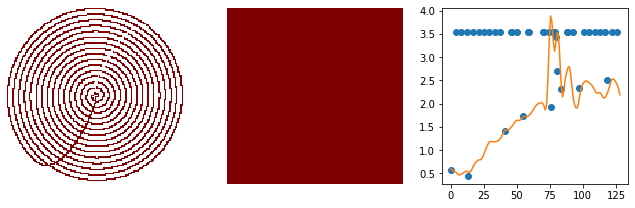

Iteration=51
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


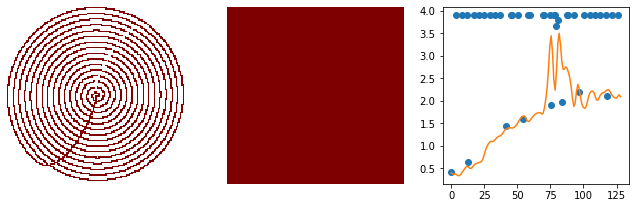

Iteration=52
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


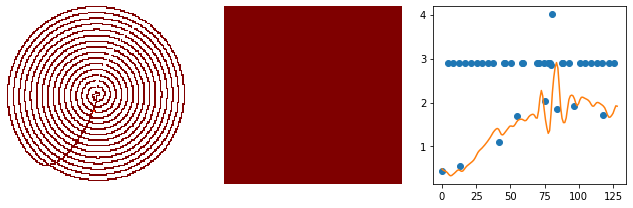

Iteration=53
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


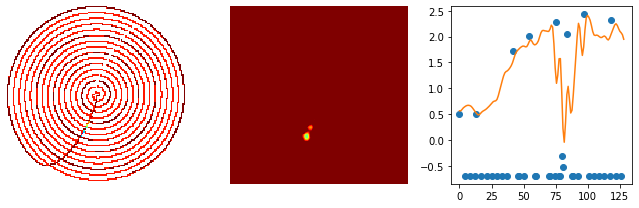

Iteration=54
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


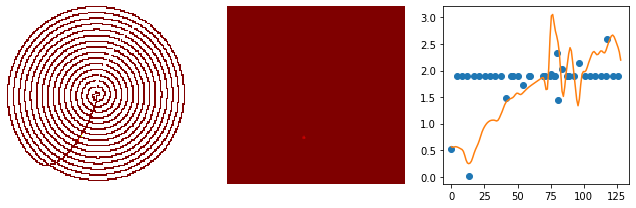

Iteration=55
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


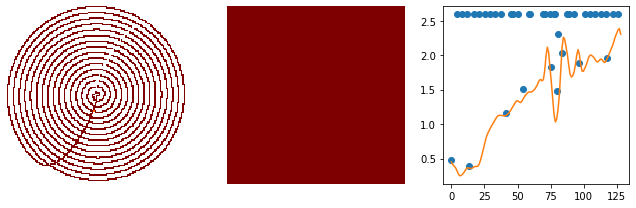

Iteration=56
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


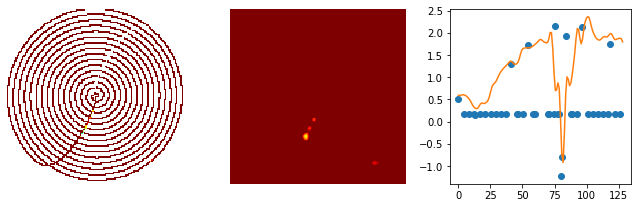

Iteration=57
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


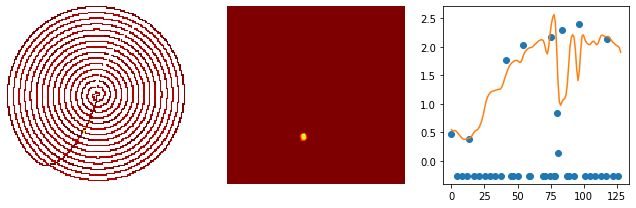

Iteration=58
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


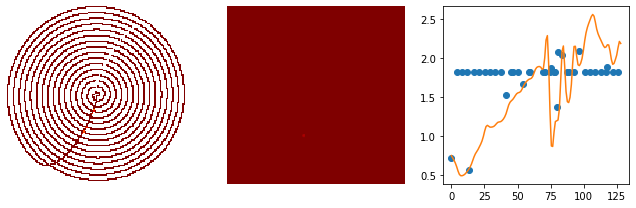

Iteration=59
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


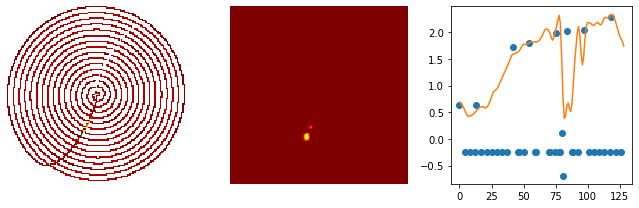

Iteration=60
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


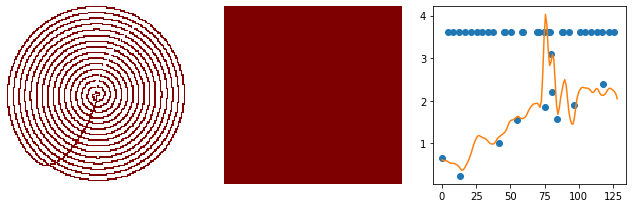

Iteration=61
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


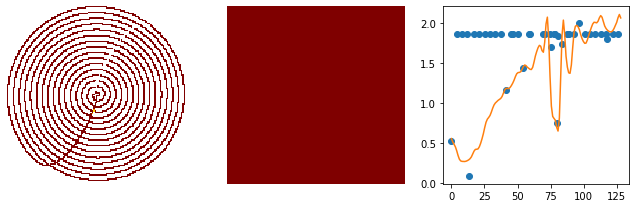

Iteration=62
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


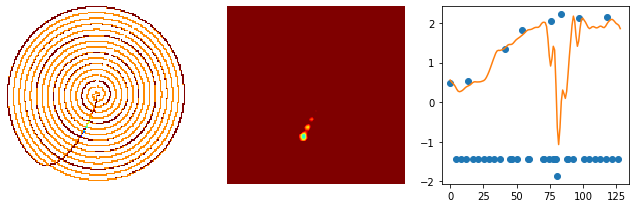

Iteration=63
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


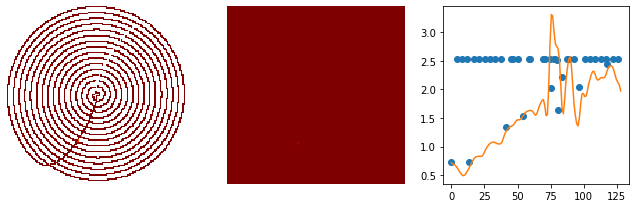

Iteration=64
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


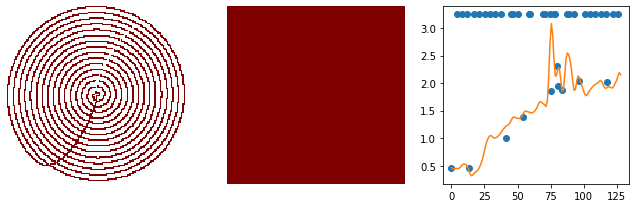

Iteration=65
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


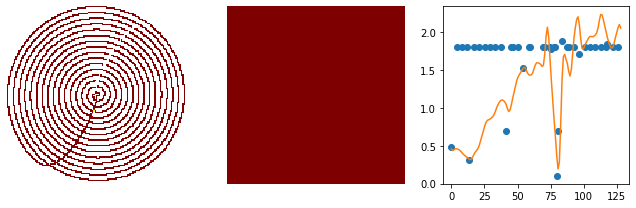

Iteration=66
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


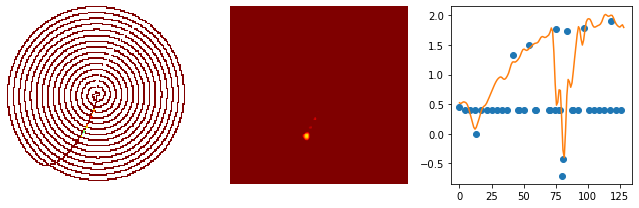

Iteration=67
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


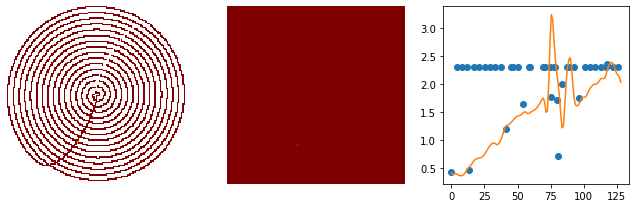

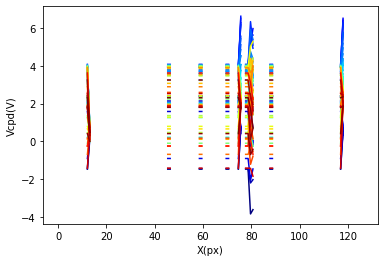

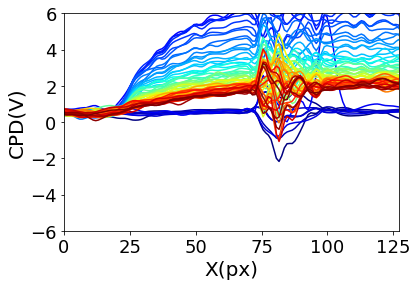

In [10]:
n_frames=68
line=60
profiles=np.zeros((n_frames,imagesize))
profiles_rec=np.zeros((n_frames,imagesize))
VDC_fullmatPos=np.zeros((n_frames,imagesize,imagesize))

path_save= r'F:\ORNL\Experimental data\Cypher North\2022\Dec 2022\9th\spiral scanns\+6V_grounded electrode\\'

for i in range(n_frames):
    filename=path_save+'+6V_10spirals_1sec'+str(i+1)+'_ai0.txt'
    print('Iteration='+str(i))
    
    VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=0)
    for j in range(len(array10x)):
        VCPD[array10x[j],array10y[j]]=np.nan        
    VCPD_rec = GP_Structured(VCPD,6);
    VDC_fullmatPos[i,:,:]=VCPD_rec
    
    VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=0)
    VCPD[mask==0]=np.nan
    for j in range(len(array10x)):
        VCPD[array10x[j],array10y[j]]=np.nan
        
    profiles[i,:]=VCPD[:,line]
    profiles_rec[i,:]=VCPD_rec[:,line]
    
    fig, ax = plt.subplots(1, 3, figsize=(9, 3))
    
    im1=ax[0].imshow((VCPD),vmin=-6,vmax=0,cmap='jet',interpolation='none')
    ax[0].axis('off')
    ax[1].imshow((VCPD_rec),vmin=-6,vmax=0,cmap='jet')
    ax[1].axis('off')
    ax[2].plot(np.linspace(0,128,128),profiles[i,:],'o')
    ax[2].plot(np.linspace(0,128,128),profiles_rec[i,:])
    plt.tight_layout()
    
    plt.show()

colors = plt.cm.jet(np.linspace(0,1,n_frames))
for i in range(n_frames):
    plt.plot(np.linspace(0,128,128),profiles[i,:],color=colors[i])

plt.xlabel('X(px)')
plt.ylabel('Vcpd(V)')
plt.show()

plt.rcParams.update({'font.size': 18})
colors = plt.cm.jet(np.linspace(0,1,n_frames))

for i in range(n_frames):
    plt.plot(np.linspace(0,128,128),profiles_rec[i,:],color=colors[i])
    
plt.xlabel("X(px)",fontsize=20)
plt.ylabel('CPD(V)',fontsize=20)
plt.xlim([0,127])
plt.ylim([-6,6])
plt.show()

## Save the animation of the GP reconstruction 

Frame num = 0
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 1
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 

Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 17
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 18
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1


Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 34
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 35
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculatin

Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 50
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Frame num = 51
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1


Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


MovieWriter PillowWriter unavailable; using Pillow instead.


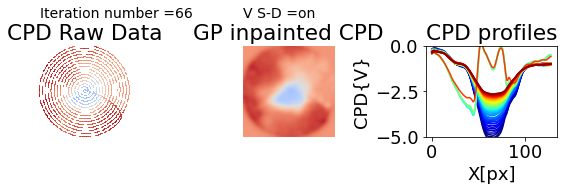

In [12]:
n_frames=68
line=60
profiles=np.zeros((n_frames,imagesize))
profiles_rec=np.zeros((n_frames,imagesize))
#VDC_fullmatPos=np.zeros((n_frames,imagesize,imagesize))
frame_on=8

##Animation 
path_save= r'F:\ORNL\Experimental data\Cypher North\2023\Jan\26th\spiral scann\After-10V_25sec\\'
# We do the animation of the shift correction
os.chdir(path_save)

fig, ax = plt.subplots(1, 3, figsize=(8, 3))
ax[0].set_title('CPD Raw Data' )
ax[1].set_title('GP inpainted CPD')
ax[2].set_title('CPD profiles' )
ax[2].set_xlabel('X[px]')
ax[2].set_ylabel('CPD{V}')
ax[0].axis('off')
ax[1].axis('off')
ax[2].set_ylim([-5,0])

camera = Camera(fig)
colors = plt.cm.jet(np.linspace(0,1,n_frames))
for i in range(n_frames-1):
    print('Frame num =',i)
    filename=path_save+'TiO2_diffusion_'+str(i+1)+'_ai1.txt'
    
    VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
    for j in range(len(array10x)):
        VCPD[array10x[j],array10y[j]]=np.nan  
    VCPD_rec = GP_Structured(VCPD,6);
    #VDC_fullmatPos[i,:,:]=VCPD_rec
    VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)
    VCPD[mask==0]=np.nan
    for j in range(len(array10x)):
        VCPD[array10x[j],array10y[j]]=np.nan
    profiles_rec[i,:]=VCPD_rec[:,line]
    
    im1=ax[0].imshow(np.rot90(VCPD),vmin=-4,vmax=0,cmap='coolwarm',interpolation='none')
    im2=ax[1].imshow(np.rot90(VCPD_rec),vmin=-4,vmax=0,cmap='coolwarm')
    
    for j in range(i+1):
        ax[2].plot(np.linspace(0,128,128),profiles_rec[j,:],color=colors[j])
    
    plt.tight_layout()

    ax[0].text(0,-40,'Iteration number =' + str(i), fontsize=14)
    
    if i<7:
        state='off'
    else:
        state='on'
        
    ax[1].text(0,-40,'V S-D =' + state, fontsize=14)
    camera.snap()
    
animation = camera.animate()
animation.save('S2 Animation +6V_test.gif', writer='PillowWriter', fps=1)

## Map of Characteristic times
Single eponential or double exponential can be fitted in here

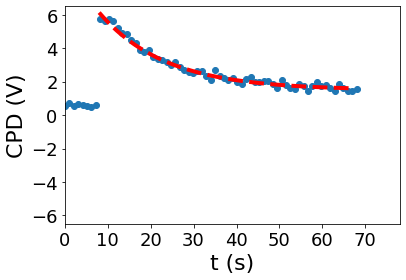

[ 4.62877869 15.48868823  1.49883921]
6.127617905898565
0.9819033180309809


In [14]:
%matplotlib inline
bad_frames=[]
#-10VBadframes [27,31,34,58,60]
#-8VBadframes [20,60,65,66]
#-5VBadframes [20,33,39,54,65]
#5VBadframes [18,55,64]
#8VBadframes [58,63,65,66,67,68]
#10VBadframes [47,48,51,56,57]

#We plot and fit single exp pixel:
Xpixel=60
Ypixel=60

frame_on=8

VDC_fullmat=VDC_fullmatPos
#we correct for the bad frames:
for i in range(n_frames):
    if i+1 in bad_frames:
        VDC_fullmat[i,:,:]=(VDC_fullmat[i-1,:,:]+VDC_fullmat[i+1,:,:])/2

t=np.linspace(0,(n_frames-frame_on-1),n_frames-frame_on-1)
t_full=np.linspace(0,(n_frames),n_frames-1)

guess=[10,30,1]
#guess=[10,30,1,10,1]

def func(x, a, b, c):
    return a * np.exp(-x/b) + c

def func2(x, a, b, c, a2, b2):
    return a * np.exp(-x/b)  + a2 * np.exp(-x/b2) + c

popt, pcov = curve_fit(func, t, VDC_fullmat[frame_on:n_frames-1,Xpixel,Ypixel],p0=guess)

residuals = VDC_fullmat[frame_on:n_frames-1,Xpixel,Ypixel]- func(t, *popt)
ss_res = np.sum(residuals**2)
ss_tot = np.sum((VDC_fullmat[frame_on:n_frames-1,Xpixel,Ypixel]-np.mean(VDC_fullmat[frame_on:n_frames-1,Xpixel,Ypixel]))**2)
r_squared = 1 - (ss_res / ss_tot)

plt.plot(t_full, VDC_fullmat[:-1,Xpixel,Ypixel],'o',markersize=6)
plt.plot(t+frame_on, func(t, *popt), 'r--',linewidth=4)
plt.xlabel('t (s)', fontsize='22')
plt.ylabel('CPD (V)', fontsize='22')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlim([0,78])
plt.ylim([-6.5,6.5])
plt.show()
print(popt)
print(popt[0]+popt[2])
print(r_squared)


<ipython-input-14-a0b2525b218d>:29: RuntimeWarning: overflow encountered in exp
  return a * np.exp(-x/b) + c


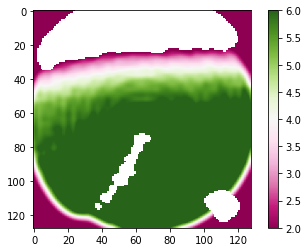

[[0.03815459 0.03815395 0.03815321 ... 0.03815708 0.03815656 0.03815617]
 [0.038154   0.03815295 0.03815173 ... 0.03815832 0.0381574  0.03815667]
 [0.03815329 0.03815173 0.03814992 ... 0.03815966 0.03815831 0.03815724]
 ...
 [0.03823627 0.03829149 0.03836    ... 0.03824744 0.03821772 0.03819267]
 [0.03820938 0.03824571 0.03829037 ... 0.03821728 0.03819732 0.03818048]
 [0.0381873  0.03820855 0.0382344  ... 0.0381918  0.03818008 0.03817016]]


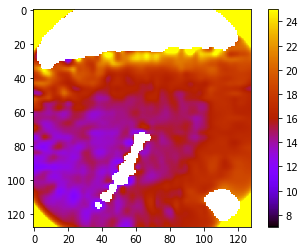

[[42.42875147 42.42771805 42.42649021 ... 42.42249891 42.42491222
  42.42686564]
 [42.42770197 42.42596113 42.42392523 ... 42.41658769 42.42082321
  42.42420437]
 [42.42644557 42.42388009 42.42085343 ... 42.40988949 42.41621125
  42.42124846]
 ...
 [41.96183508 41.66526079 41.31765685 ... 42.29146816 42.33565759
  42.37321444]
 [42.11248593 41.90950901 41.66993557 ... 42.33563746 42.36582392
  42.39141069]
 [42.23952803 42.11654434 41.97062062 ... 42.3729236  42.39126962
  42.4067907 ]]


<Figure size 432x288 with 0 Axes>

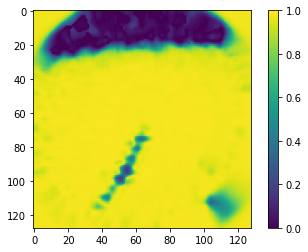

[[0.97801984 0.97801954 0.97801915 ... 0.97802131 0.97802102 0.97802071]
 [0.97801935 0.97801874 0.97801795 ... 0.97802109 0.9780209  0.97802062]
 [0.97801886 0.97801792 0.97801673 ... 0.97802107 0.97802093 0.97802062]
 ...
 [0.97820939 0.97833131 0.97847313 ... 0.9778777  0.9779253  0.97796432]
 [0.97814856 0.97823212 0.97833023 ... 0.9779273  0.97795807 0.97798347]
 [0.97809665 0.97814692 0.97820632 ... 0.97796869 0.97798564 0.97799969]]


In [17]:
%matplotlib inline
#We do it for all the pixels
c_map=np.zeros((imagesize,imagesize))
V0_map=np.zeros((imagesize,imagesize))
tau=np.zeros((imagesize,imagesize))
tau2=np.zeros((imagesize,imagesize))
R2=np.zeros((imagesize,imagesize))

for i in range(imagesize):
    for j in range(imagesize):
        
        try:
            popt, pcov = curve_fit(func, t, VDC_fullmat[frame_on:n_frames-1,i,j],p0=guess)
            residuals = VDC_fullmat[frame_on:n_frames-1,i,j]- func(t, *popt)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((VDC_fullmat[frame_on:n_frames-1,i,j]-np.mean(VDC_fullmat[frame_on:n_frames-1,i,j]))**2)
            r_squared = 1 - (ss_res / ss_tot)
            R2[i,j]=r_squared
            c_map[i,j]=popt[0]
            tau[i,j]=popt[1]
            V0_map[i,j]=popt[0]+popt[2]
            #tau2[i,j]=popt[3]
        except:
            tau[i,j]='Nan'
            c_map[i,j]='Nan'
            V0_map[i,j]='Nan'
            #tau2[i,j]='Nan'
        if popt[1]<0 or popt[1]>100 or R2[i,j]<0.8:
            tau[i,j]='Nan'
            c_map[i,j]='Nan'
            V0_map[i,j]='Nan'
            #tau2[i,j]='Nan'
            
plt.figure()
plt.imshow(V0_map, vmin=2,vmax=6,cmap='PiYG')
plt.colorbar()
plt.show()
print(c_map)

plt.figure()
plt.imshow(tau, vmin=7,vmax=25,cmap='gnuplot')
plt.colorbar()
plt.show()
print(tau)

plt.figure()
#plt.imshow(tau2, vmin=0,vmax=4,cmap='gnuplot')
#plt.colorbar()
#plt.show()
#print(tau2)
plt.figure()
plt.imshow(R2, vmin=0,vmax=1,cmap='viridis')
plt.colorbar()
plt.show()
print(R2)

## SNR comparision rater and spiral scan

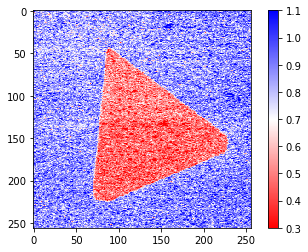

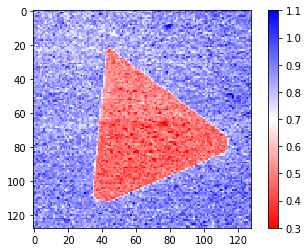

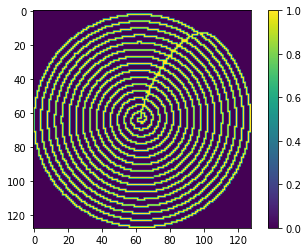

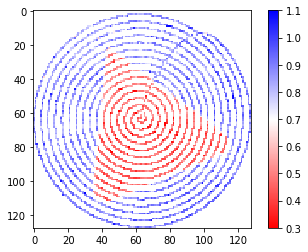

Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


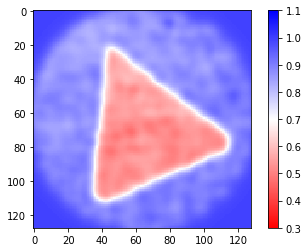

Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done
Model training...
Calculating predictive mean and uncertainty...
Batch 1/1
Done


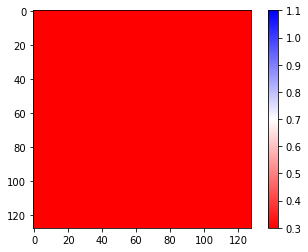

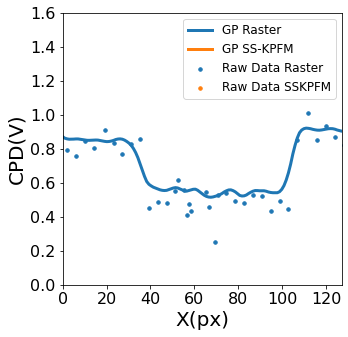

In [18]:
#We import the 
path_save= r'F:\ORNL\Experimental data\Cypher North\2022\Dec 2022\8th\\'
filename_rast=path_save+'HKPFM_WS2_0008UserIn1Retrace.txt'

raster_image=np.rot90(np.loadtxt(filename_rast, delimiter='\t'))
plt.imshow(raster_image, vmin=0.3,vmax=1.1,cmap='bwr_r',interpolation='none')
plt.colorbar()
plt.show()

from skimage import data, color
from skimage.transform import rescale, resize, downscale_local_mean

raster_image_128 = downscale_local_mean(raster_image, (2, 2))
plt.imshow(raster_image_128, vmin=0.3,vmax=1.1,cmap='bwr_r',interpolation='none')
plt.colorbar()
plt.show()

path_save= r'F:\ORNL\Experimental data\Cypher North\2022\Dec 2022\8th\spiral scann\24_spiral_8sec\\'
filename2=path_save+'WS2_24_spiral_8sec6_ai0.txt'
imagesize=128
k_rot=2

#arrays of points to delete for the initial of the spiral
array24x=[60,60,54,52,50,49,47,45,44,44,42,42,40,40,37,35,35,33,31,30,28,26,25,24,23,22,21,20,19,16,16,16,15,14,14,14]
array24y=[63,64,65,66,67,67,68,69,69,70,70,71,71,72,73,74,75,76,77,77,79,81,81,83,83,85,85,87,87,91,92,93,94,94,97,98]

#plot the data
VCPD=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)

cont=0
#we find the mask
mask=np.zeros((imagesize,imagesize))
rastered_image_masked=np.zeros((imagesize,imagesize))
for ii in range(VCPD.shape[0]):
    for jj in range(VCPD.shape[1]):
        rastered_image_masked[ii,jj] = np.nan
        if VCPD[ii,jj] != VCPD[0,0]:
            mask[ii,jj] = 1
            rastered_image_masked[ii,jj] = raster_image_128[ii,jj]
            cont=cont+1
            
for i in range(len(array24x)):
    rastered_image_masked[array24x[i],array24y[i]]=np.nan
            
#plot the mask
plt.imshow(mask)
plt.colorbar()
plt.show()

#plot the masked raster image
plt.imshow(rastered_image_masked,vmin=0.3,vmax=1.1,cmap='bwr_r',interpolation='none')
plt.colorbar()
plt.show()

#reconstruct the the masked raster image and plot
recGP_raster = GP_Structured(rastered_image_masked,8);
plt.imshow(recGP_raster,vmin=0.3,vmax=1.1,cmap='bwr_r',interpolation='none')
plt.colorbar()
plt.show()

#reconstruct the SS-KPFM
recGP = GP_Structured(VCPD,8);
plt.imshow(recGP,vmin=0.3,vmax=1.1,cmap='bwr_r',interpolation='none')
plt.colorbar()
plt.show()

line=64
plt.figure(figsize=(5,5))
plt.scatter(np.linspace(0,128,128),rastered_image_masked[:,line],s=12,label='Raw Data Raster')
plt.scatter(np.linspace(0,128,128),VCPD[:,line],s=12,label='Raw Data SSKPFM')
plt.plot(np.linspace(0,128,128),recGP_raster[:,line],linewidth=3,label='GP Raster')
plt.plot(np.linspace(0,128,128),recGP[:,line],linewidth=3,label='GP SS-KPFM')
plt.legend()
plt.xlabel('X(px)',fontsize=20)
plt.ylabel('CPD(V)',fontsize=20)
plt.legend(fontsize=12)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.xlim([0,127])
plt.ylim([0,1.6])
plt.show()

## Calculation of drivative of the topography image

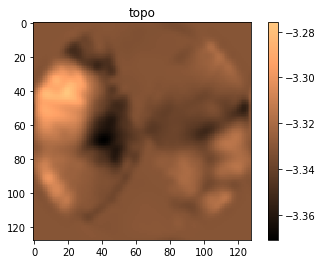

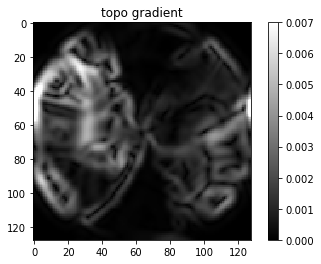

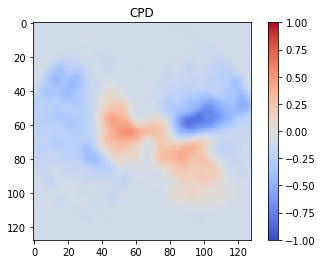

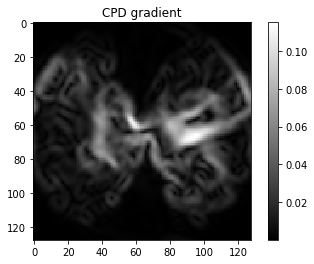

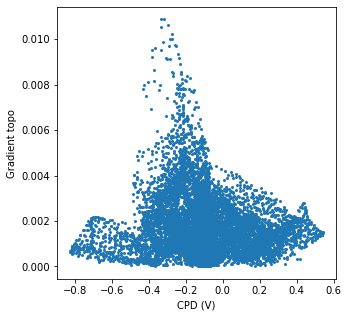

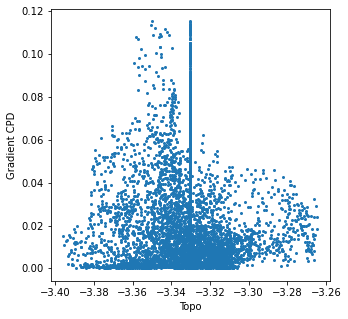

In [19]:
path_save= r'F:\ORNL\Experimental data\Cypher North\2023\Jan\26th\spiral scann\After10V_25sec\\'
filename=path_save+'TiO2_diffusion_3_ai0.txt'
filename2=path_save+'TiO2_diffusion_3_ai1.txt'
imagesize=128
k_rot=0

#plot the data
topo=np.rot90(np.loadtxt(filename, delimiter=','),k=k_rot)

itern=7
levels=2
lambd=4

recGP= SSTEM(topo,mask,itern,levels,lambd)
plt.imshow(recGP,cmap='copper',interpolation='none')
plt.title("topo")
plt.colorbar()
plt.show()

grad_x,grad_y=np.gradient(recGP)
grad_mod=np.sqrt((grad_x)**2+(grad_y)**2)

plt.imshow(grad_mod,vmin=0,vmax=0.007,cmap='gray',interpolation='none')
plt.colorbar()
plt.title("topo gradient")
plt.show()

#plot the data
CPD=np.rot90(np.loadtxt(filename2, delimiter=','),k=k_rot)
CPD_recGP= SSTEM(CPD,mask,itern,levels,lambd)
plt.imshow(CPD_recGP,vmin=-1,vmax=1,cmap='coolwarm',interpolation='none')
plt.title("CPD")
plt.colorbar()
plt.show()

CPD_grad_x,CPD_grad_y=np.gradient(CPD_recGP)
CPD_grad_mod=np.sqrt((CPD_grad_x)**2+(CPD_grad_y)**2)

plt.imshow(CPD_grad_mod,cmap='gray',interpolation='none')
plt.colorbar()
plt.title("CPD gradient")
plt.show()

plt.figure(figsize=(5,5))
plt.scatter(CPD_recGP,grad_mod,s=4)
plt.xlabel("CPD (V)")
plt.ylabel("Gradient topo")
plt.show()

plt.figure(figsize=(5,5))
plt.scatter(topo,CPD_grad_mod,s=4)
plt.xlabel("Topo")
plt.ylabel("Gradient CPD")
plt.show()